In [1]:
#SD_narrowband.ipynb
## CHRONIC NARROWBAND LFP POWER ANALYSIS
#Arjun Balachandar Sept 2024
#Analyze narrowband beta-band recordings in SD and non-SD in S004/DBS036
#Of note, non-SD is often referred to as oneYear, although patients non-SD recordings could be at anytime in the non-SD period

#Directories and File Names
PATH = #insert corresponding path
lfpDir = PATH + 'data_processed/'
clinVarFile = PATH + 'statusDystonicusDates_NEW.csv'
implantDateFile = PATH + 'patientSummary.csv'
optimalChannelsFile = PATH + 'AvailabilitySummary - with optimal channels - deidentified.xlsx' # Determined in consultation with Dr George Ibrahim
resultsDir = PATH + 'Analysis/'
resultsLFPPowersDir = resultsDir + 'LFP Powers/'
resultsPSDsDir = resultsDir + 'PSDs/'
resultsPSDPeaksDir = resultsDir + 'PSDPeaks/'
resultsFilename = 'powerChangesAfterCuringStatusDystonicus.csv'
resultsPSDFilename = 'PSDsAfterCuringStatusDystonicus.csv'
resultsCohDir = resultsDir + 'Coherence/'
resultsCohFilename = 'coherenceAfterCuringStatusDystonicus.csv'
demographicsDir = PATH + 'Demographics/'
demographicsFile = demographicsDir + 'MulticentrePediatric-Demographics and clinical data (raw)_ArjunEdit.csv'
moredemographicsDir = PATH + 'Demographics/Additional Metrics/' #additional clinical metrics
moredemographicsBasicInfo = moredemographicsDir + 'MulticentrePediatric-ClinicalData Dystonia Labelled.csv'
moredemographicsFile_baseline = moredemographicsDir + 'MulticentrePediatric-BaselineDystonia.csv'
moredemographicsFile_6m = moredemographicsDir + 'MulticentrePediatric-6mDystonia.csv'
moredemographicsFile_1y = moredemographicsDir + 'MulticentrePediatric-1yDystonia.csv'
moredemographicsFile_2y = moredemographicsDir + 'MulticentrePediatric-2yDystonia.csv'
moredemographicsFile_3y = moredemographicsDir + 'MulticentrePediatric-3yDystonia.csv'

#Frequency bands
betaLim = [12.5, 30] # In Hertz, define the beta band
thetaLim = [3, 7] # 3.5-7 as per Mark, Was [4,7] before 31 Jan
deltaLim = [1,3]
alphaLim = [7,12.5]
gammaLim = [30,60]
lowbetaLim = [12.5, 20]
highbetaLim = [20, 30]
lowgammaLim = [30, 40]
highgammaLim = [40, 60]
channelOverride = False # True # Should be false. Set to true if you want to set the channel manually (not recommended).
z_score_norm = False #Normalize the LFP values by z-scoring normalization if True
normalize_PSD = True #Normalize the PSD values by dividing by sum of total power of PSD
normalize_clinical_columns = False
normalize_LFP_columns = True

# Initializations
import os
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from scipy import signal
from scipy.signal import welch
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import zscore
import re #regular expression
import neurodsp
from neurodsp.utils.norm import normalize_sig
from neurodsp.utils import create_times
from neurodsp.plts.time_series import plot_time_series, plot_instantaneous_measure
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, FunctionTransformer
import itertools
import seaborn as sns
import statsmodels.api as sm
from statsmodels.robust.norms import HuberT
from scipy.stats import mannwhitneyu
from scipy.stats import kruskal
import statsmodels.formula.api as smf
import scikit_posthocs as sp
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import RANSACRegressor
from sklearn.linear_model import TheilSenRegressor

diff = lambda x, y: y - x

# Load and process the dates
clinVars_df = pd.read_csv(clinVarFile, delimiter=',')
implantDates_df = pd.read_csv(implantDateFile, delimiter=',')
patList = clinVars_df['Subject ID'].values

plt.rcParams['figure.dpi'] = 600

In [2]:
import os
import pandas as pd
from datetime import datetime, timedelta

patList = ['DBS036']
betaLim = [12.5, 30]  # Define the beta-band frequency range

for subjID in patList:
    # Load the timeseries data for the patient
    file_path = os.path.join(lfpDir, f'{subjID}_narrowband.csv')
    print('Loading narrowband LFP data for patient ' + subjID)
    narrowband_df = pd.read_csv(file_path, delimiter=',')
    
    # Convert 'Frequency' column to numeric (in case there are any issues)
    narrowband_df['Frequency'] = pd.to_numeric(narrowband_df['Frequency'], errors='coerce')

    # Filter data to include only beta-band frequencies
    narrowband_df = narrowband_df[(narrowband_df['Frequency'] >= betaLim[0]) & (narrowband_df['Frequency'] <= betaLim[1])]

    implantDate = implantDates_df.loc[implantDates_df['Patient ID'] == subjID, 'Implant date'].values[0]
    implantDate = datetime.strptime(implantDate, '%Y-%m-%d')
    
    # Split the data into status and oneYear
    registry_df = clinVars_df.copy()
    registry_df = registry_df.loc[registry_df['Subject ID'] == subjID]
    
    if registry_df.empty:
        print('No registry data for patient', subjID)
        continue
    if pd.isna(registry_df['Date of Status dystonicus'].values[0]):
        print('No status dystonicus data for patient', subjID)
        continue
    
    status_date = datetime.strptime(registry_df['Date of Status dystonicus'].values[0], '%d-%b-%y')
    startDate = max(status_date, implantDate)
    non_status_date = startDate + timedelta(days=90)
    discharge_date = datetime.strptime(registry_df['Date of Discharge'].values[0], '%d-%b-%y')
    
    print('Processing patient', subjID, '.')
    
    # Make new column in narrowband_df called 'intervalType' and set it to 'status' if the date is before status_date and discharge_date, 
    # and 'non-status' if the date is more than non_status_date
    def determine_interval_type(row, status_date, discharge_date, non_status_date):
        # Convert 'DateTime (Local)' to datetime format
        date_time = pd.to_datetime(row['DateTime (Local)'], format='%Y-%m-%d %H:%M:%S')
        
        # Check the conditions for 'status' and 'non_status'
        if status_date <= date_time <= discharge_date:
            return 'status'
        elif date_time > non_status_date:
            return 'non_status'
        else:
            return 'other'  # Handle cases where it doesn't match the conditions
    
    print('Status Date:', status_date)
    print('Discharge Date:', discharge_date)
    print('Non-Status Date:', non_status_date)
    
    # Apply the function to create the 'intervalType' column
    narrowband_df['intervalType'] = narrowband_df.apply(determine_interval_type, axis=1, 
                                                        status_date=status_date, 
                                                        discharge_date=discharge_date, 
                                                        non_status_date=non_status_date)

    print(narrowband_df.head())


Loading narrowband LFP data for patient DBS036
Processing patient DBS036 .
Status Date: 2023-03-20 00:00:00
Discharge Date: 2023-04-24 00:00:00
Non-Status Date: 2023-06-18 00:00:00
         DateTime (UTC)  LFP power Hemisphere  Frequency Timezone  \
0  2023-03-23T21:36:17Z       5071          L       12.7      EST   
2  2023-03-23T21:46:17Z       5740          L       12.7      EST   
4  2023-03-23T21:56:17Z       5602          L       12.7      EST   
6  2023-03-23T22:06:17Z       5181          L       12.7      EST   
8  2023-03-23T22:16:17Z       4775          L       12.7      EST   

      DateTime (Local) intervalType  
0  2023-03-23 17:36:17       status  
2  2023-03-23 17:46:17       status  
4  2023-03-23 17:56:17       status  
6  2023-03-23 18:06:17       status  
8  2023-03-23 18:16:17       status  


"patList = ['DBS050']\n\nfor subjID in patList:\n    # Load the timeseries data for the current patient\n    file_path = os.path.join(lfpDir, f'{subjID}_narrowband.csv')\n    print('Loading narrowband LFP data for patient ' + subjID)\n    narrowband_df = pd.read_csv(file_path, delimiter=',')\n    \n    implantDate = implantDates_df.loc[implantDates_df['Patient ID'] == subjID, 'Implant date'].values[0]\n    implantDate = datetime.strptime(implantDate, '%Y-%m-%d')\n    #Split the data into status and oneYear\n    registry_df = clinVars_df.copy()\n    registry_df = registry_df.loc[registry_df['Subject ID'] == subjID]\n    if registry_df.empty:\n        print('No registry data for patient', subjID)\n        continue\n    if pd.isna(registry_df['Date of Status dystonicus'].values[0]):\n        print('No status dystonicus data for patient', subjID)\n        continue\n    \n    status_date = datetime.strptime(registry_df['Date of Status dystonicus'].values[0], '%d-%b-%y')\n    startDate = max

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/402311191.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)


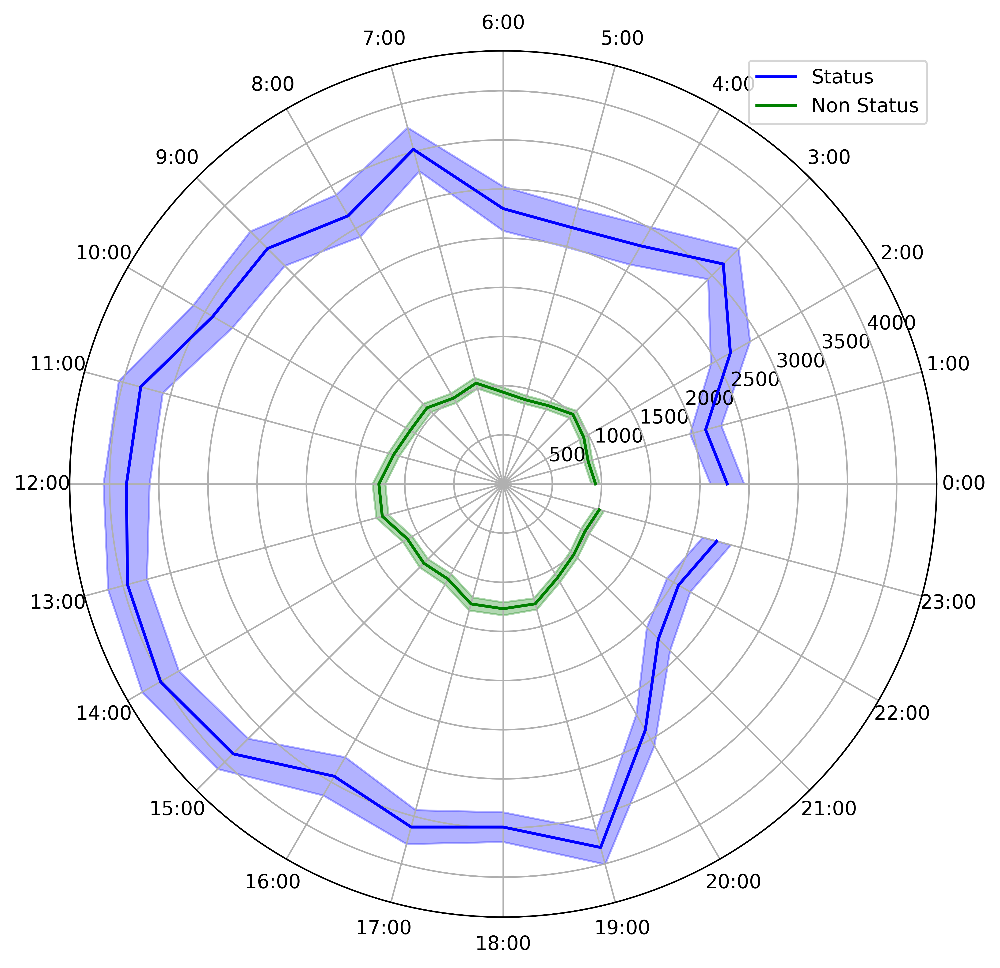

IntervalType: non_status
Total Recording Time: 60 days and 16 hours

IntervalType: other
Total Recording Time: 54 days and 23 hours

IntervalType: status
Total Recording Time: 31 days and 6 hours



In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pytz
from scipy import stats

# Assuming narrowband_df is your dataframe
# Convert 'DateTime (UTC)' to datetime and EST
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')
narrowband_df['Hour (EST)'] = narrowband_df['DateTime (EST)'].dt.hour

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Function to remove outliers using the IQR method
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers using IQR method for all 'status', 'non_status', and 'other'
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)

# Group by 'Hour (EST)' and 'intervalType' and calculate average 'LFP power' and standard error
df_grouped = df_filtered.groupby(['Hour (EST)', 'intervalType']).agg(
    LFP_mean=('LFP power', 'mean'),
    LFP_std=('LFP power', 'std'),
    count=('LFP power', 'size')
).reset_index()

# Calculate the 95% confidence intervals
df_grouped['LFP_se'] = df_grouped['LFP_std'] / np.sqrt(df_grouped['count'])
df_grouped['LFP_ci_lower'] = df_grouped['LFP_mean'] - stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']
df_grouped['LFP_ci_upper'] = df_grouped['LFP_mean'] + stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']

# Prepare data for plotting
hours = np.linspace(0, 2 * np.pi, 24, endpoint=False)  # Angles for each hour

# Create pivot tables to access the average LFP Power and confidence intervals by hour and intervalType
status_data = df_grouped[df_grouped['intervalType'] == 'status'].set_index('Hour (EST)')
non_status_data = df_grouped[df_grouped['intervalType'] == 'non_status'].set_index('Hour (EST)')
other_data = df_grouped[df_grouped['intervalType'] == 'other'].set_index('Hour (EST)')

# Align data to 24 hours for 'status', 'non_status', and 'other'
status_lfp = status_data['LFP_mean'].reindex(range(24), fill_value=0)
status_ci_lower = status_data['LFP_ci_lower'].reindex(range(24), fill_value=0)
status_ci_upper = status_data['LFP_ci_upper'].reindex(range(24), fill_value=0)

non_status_lfp = non_status_data['LFP_mean'].reindex(range(24), fill_value=0)
non_status_ci_lower = non_status_data['LFP_ci_lower'].reindex(range(24), fill_value=0)
non_status_ci_upper = non_status_data['LFP_ci_upper'].reindex(range(24), fill_value=0)

other_lfp = other_data['LFP_mean'].reindex(range(24), fill_value=0)
other_ci_lower = other_data['LFP_ci_lower'].reindex(range(24), fill_value=0)
other_ci_upper = other_data['LFP_ci_upper'].reindex(range(24), fill_value=0)

# PRINT HOW LONG RECORDING WAS FOR EACH INTERVAL TYPE
# Convert 'DateTime (UTC)' to date a
# nd hours to calculate the duration
df_filtered['Date'] = df_filtered['DateTime (UTC)'].dt.date
# Group by 'intervalType' to get the recording period
recording_duration = df_filtered.groupby('intervalType').agg(
    min_time=('DateTime (UTC)', 'min'),
    max_time=('DateTime (UTC)', 'max')
).reset_index()
# Calculate the total duration in hours for each intervalType
recording_duration['total_hours'] = (recording_duration['max_time'] - recording_duration['min_time']).dt.total_seconds() / 3600
recording_duration['total_days'] = recording_duration['total_hours'] // 24
recording_duration['remaining_hours'] = recording_duration['total_hours'] % 24



/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/1929981976.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)


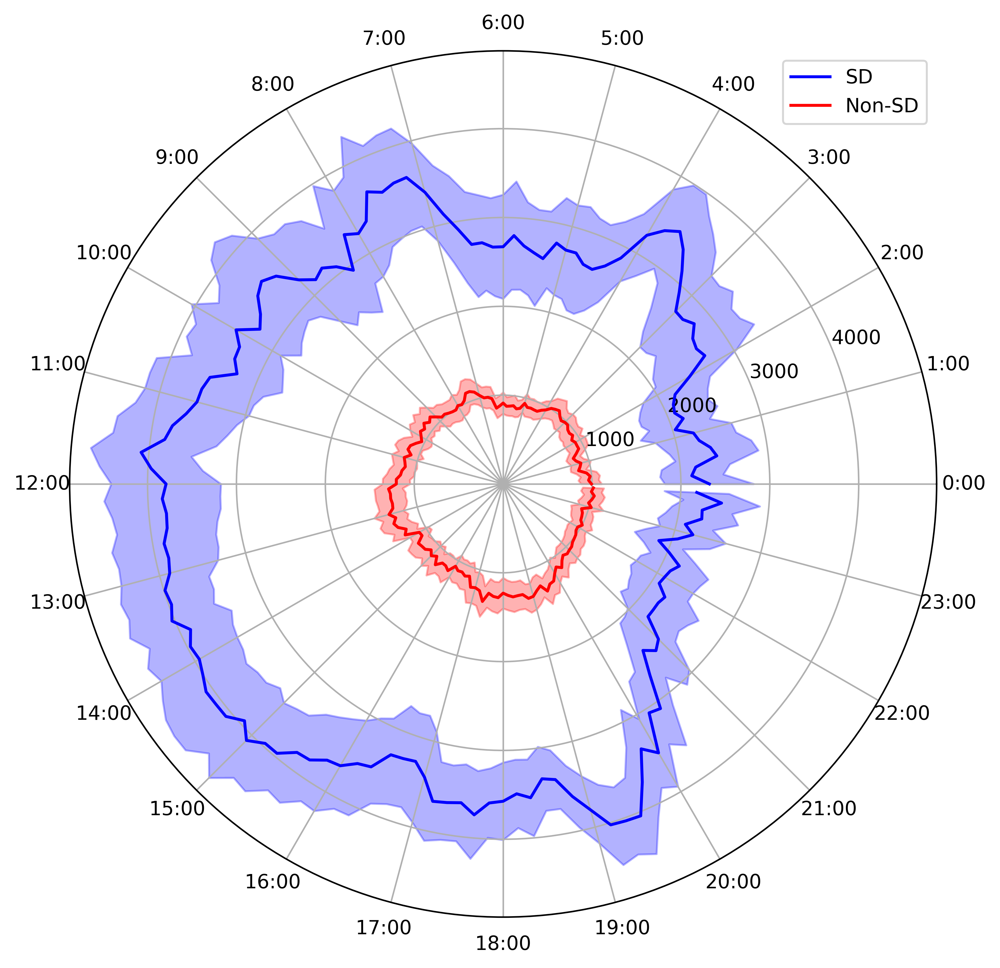

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pytz
from scipy import stats

# Assuming narrowband_df is your dataframe
# Convert 'DateTime (UTC)' to datetime and EST
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')

# Create a new column for 10-minute bins within the day
narrowband_df['Time Bin (EST)'] = narrowband_df['DateTime (EST)'].dt.hour * 60 + narrowband_df['DateTime (EST)'].dt.minute
narrowband_df['Time Bin (EST)'] = (narrowband_df['Time Bin (EST)'] // 10)  # 10-minute bins

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Function to remove outliers using the IQR method
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers using IQR method for all 'status', 'non_status', and 'other'
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)

# Group by 'Time Bin (EST)' and 'intervalType' and calculate average 'LFP power' and standard error
df_grouped = df_filtered.groupby(['Time Bin (EST)', 'intervalType']).agg(
    LFP_mean=('LFP power', 'mean'),
    LFP_std=('LFP power', 'std'),
    count=('LFP power', 'size')
).reset_index()

# Calculate the 95% confidence intervals
df_grouped['LFP_se'] = df_grouped['LFP_std'] / np.sqrt(df_grouped['count'])
df_grouped['LFP_ci_lower'] = df_grouped['LFP_mean'] - stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']
df_grouped['LFP_ci_upper'] = df_grouped['LFP_mean'] + stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']

# Prepare data for plotting
time_bins = np.linspace(0, 2 * np.pi, 144, endpoint=False)  # 144 10-minute bins

# Create pivot tables to access the average LFP Power and confidence intervals by bin and intervalType
status_data = df_grouped[df_grouped['intervalType'] == 'status'].set_index('Time Bin (EST)')
non_status_data = df_grouped[df_grouped['intervalType'] == 'non_status'].set_index('Time Bin (EST)')
other_data = df_grouped[df_grouped['intervalType'] == 'other'].set_index('Time Bin (EST)')

# Align data to 144 bins for 'status', 'non_status', and 'other'
status_lfp = status_data['LFP_mean'].reindex(range(144), fill_value=0)
status_ci_lower = status_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
status_ci_upper = status_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

non_status_lfp = non_status_data['LFP_mean'].reindex(range(144), fill_value=0)
non_status_ci_lower = non_status_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
non_status_ci_upper = non_status_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

other_lfp = other_data['LFP_mean'].reindex(range(144), fill_value=0)
other_ci_lower = other_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
other_ci_upper = other_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

# Plotting
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Plot 'status' data with confidence interval
ax.plot(time_bins, status_lfp, label='SD', color='blue')
ax.fill_between(time_bins, status_ci_lower, status_ci_upper, color='blue', alpha=0.3)

# Plot 'non_status' data with confidence interval
ax.plot(time_bins, non_status_lfp, label='Non-SD', color='red')
ax.fill_between(time_bins, non_status_ci_lower, non_status_ci_upper, color='red', alpha=0.3)

# Set the labels
ax.set_xticks(np.linspace(0, 2 * np.pi, 24, endpoint=False))  # Label every hour
ax.set_xticklabels([f'{i}:00' for i in range(24)])  # Hour labels

ax.legend()
#plt.title("Average LFP Power by 10-Minute Bins (EST) for Hemisphere 'L' with 95% Confidence Interval")

# Show the plot
plt.show()


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/3604874169.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)


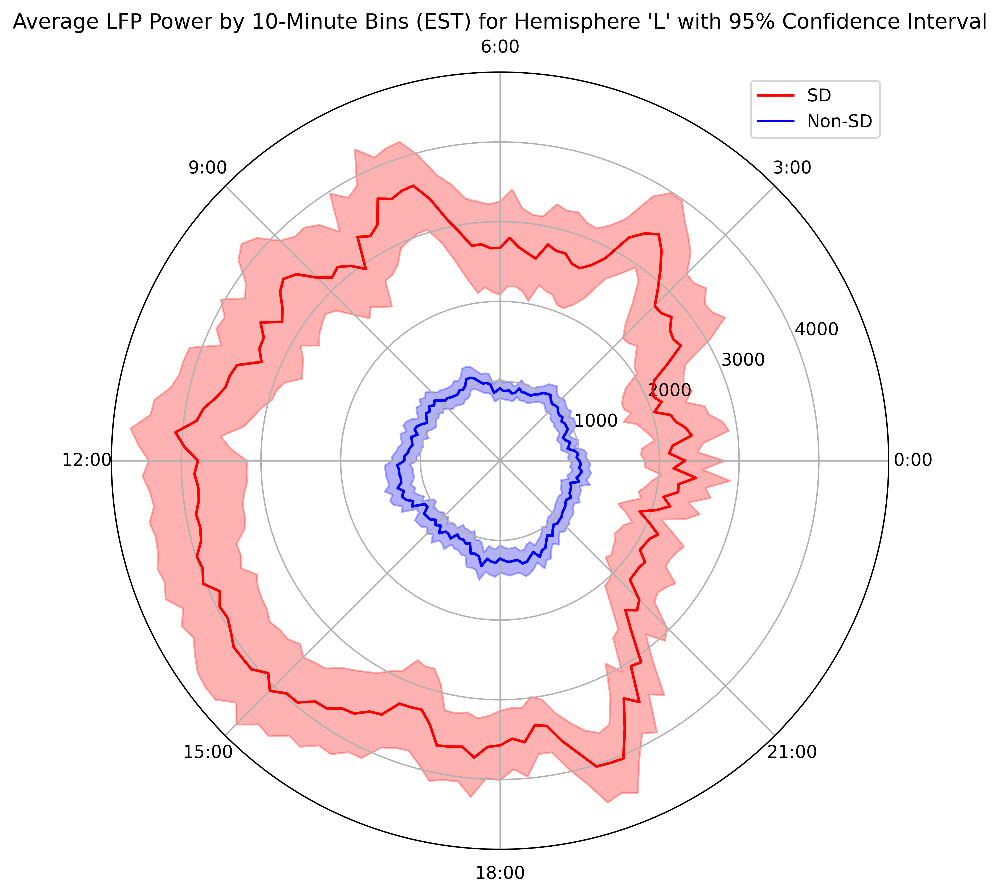

In [5]:
# Fix for continuity in circular plots
# Assuming narrowband_df is your dataframe
# Convert 'DateTime (UTC)' to datetime and EST
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')

# Create a new column for 10-minute bins within the day
narrowband_df['Time Bin (EST)'] = narrowband_df['DateTime (EST)'].dt.hour * 60 + narrowband_df['DateTime (EST)'].dt.minute
narrowband_df['Time Bin (EST)'] = (narrowband_df['Time Bin (EST)'] // 10)  # 10-minute bins

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Function to remove outliers using the IQR method
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers using IQR method for all 'status', 'non_status', and 'other'
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)

# Group by 'Time Bin (EST)' and 'intervalType' and calculate average 'LFP power' and standard error
df_grouped = df_filtered.groupby(['Time Bin (EST)', 'intervalType']).agg(
    LFP_mean=('LFP power', 'mean'),
    LFP_std=('LFP power', 'std'),
    count=('LFP power', 'size')
).reset_index()

# Calculate the 95% confidence intervals
df_grouped['LFP_se'] = df_grouped['LFP_std'] / np.sqrt(df_grouped['count'])
df_grouped['LFP_ci_lower'] = df_grouped['LFP_mean'] - stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']
df_grouped['LFP_ci_upper'] = df_grouped['LFP_mean'] + stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']

# Prepare data for plotting
time_bins = np.linspace(0, 2 * np.pi, 144, endpoint=False)  # 144 10-minute bins

# Create pivot tables to access the average LFP Power and confidence intervals by bin and intervalType
status_data = df_grouped[df_grouped['intervalType'] == 'status'].set_index('Time Bin (EST)')
non_status_data = df_grouped[df_grouped['intervalType'] == 'non_status'].set_index('Time Bin (EST)')
other_data = df_grouped[df_grouped['intervalType'] == 'other'].set_index('Time Bin (EST)')

# Align data to 144 bins for 'status', 'non_status', and 'other'
status_lfp = status_data['LFP_mean'].reindex(range(144), fill_value=0)
status_ci_lower = status_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
status_ci_upper = status_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

non_status_lfp = non_status_data['LFP_mean'].reindex(range(144), fill_value=0)
non_status_ci_lower = non_status_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
non_status_ci_upper = non_status_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

other_lfp = other_data['LFP_mean'].reindex(range(144), fill_value=0)
other_ci_lower = other_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
other_ci_upper = other_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

time_bins = np.linspace(0, 2 * np.pi, 144, endpoint=False)  # 144 10-minute bins
time_bins = np.append(time_bins, 2 * np.pi)  # Wrap around for the last point

# Wrap the data for circular continuity
status_lfp = np.append(status_lfp, status_lfp[0])
status_ci_lower = np.append(status_ci_lower, status_ci_lower[0])
status_ci_upper = np.append(status_ci_upper, status_ci_upper[0])

non_status_lfp = np.append(non_status_lfp, non_status_lfp[0])
non_status_ci_lower = np.append(non_status_ci_lower, non_status_ci_lower[0])
non_status_ci_upper = np.append(non_status_ci_upper, non_status_ci_upper[0])

# If 'other' is used, wrap it as well
other_lfp = np.append(other_lfp, other_lfp[0])
other_ci_lower = np.append(other_ci_lower, other_ci_lower[0])
other_ci_upper = np.append(other_ci_upper, other_ci_upper[0])

# Plotting
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Plot 'status' data with confidence interval
ax.plot(time_bins, status_lfp, label='SD', color='red')
ax.fill_between(time_bins, status_ci_lower, status_ci_upper, color='red', alpha=0.3)

# Plot 'non_status' data with confidence interval
ax.plot(time_bins, non_status_lfp, label='Non-SD', color='blue')
ax.fill_between(time_bins, non_status_ci_lower, non_status_ci_upper, color='blue', alpha=0.3)

'''
# Plot 'other' data with confidence interval (if needed)
ax.plot(time_bins, other_lfp, label='Other', color='green')
ax.fill_between(time_bins, other_ci_lower, other_ci_upper, color='green', alpha=0.3)
'''

# Set the labels
ax.set_xticks(np.linspace(0, 2 * np.pi, 8, endpoint=False))  # Label every hour
ax.set_xticklabels([f'{i*3}:00' for i in range(8)])  # Hour labels

ax.legend()
plt.title("Average LFP Power by 10-Minute Bins (EST) for Hemisphere 'L' with 95% Confidence Interval")

# Show the plot
plt.show()


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/2890451883.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be f

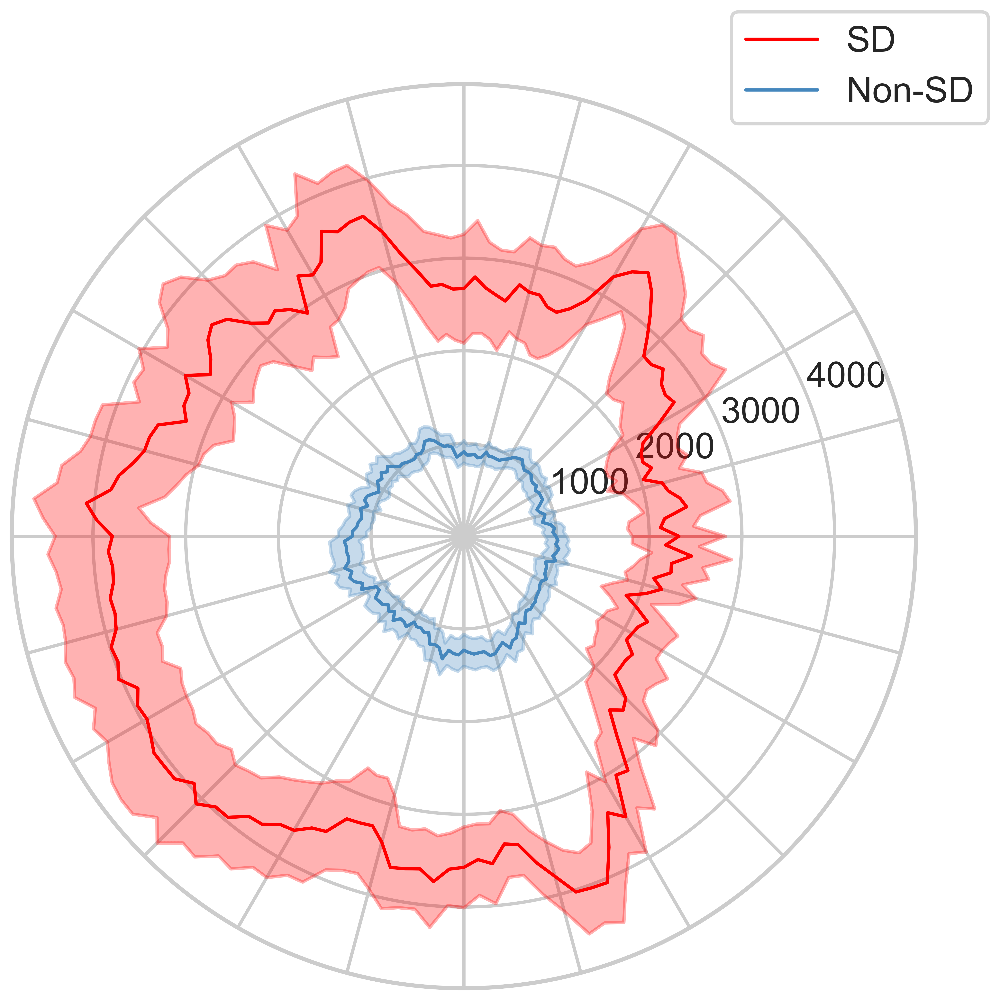

In [6]:
#OPTIMIZE PLOT
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Assuming narrowband_df is your dataframe
# Convert 'DateTime (UTC)' to datetime and EST
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')

# Create a new column for 10-minute bins within the day
narrowband_df['Time Bin (EST)'] = narrowband_df['DateTime (EST)'].dt.hour * 60 + narrowband_df['DateTime (EST)'].dt.minute
narrowband_df['Time Bin (EST)'] = (narrowband_df['Time Bin (EST)'] // 10)  # 10-minute bins

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Function to remove outliers using the IQR method
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers using IQR method for all 'status', 'non_status', and 'other'
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)

# Group by 'Time Bin (EST)' and 'intervalType' and calculate average 'LFP power' and standard error
df_grouped = df_filtered.groupby(['Time Bin (EST)', 'intervalType']).agg(
    LFP_mean=('LFP power', 'mean'),
    LFP_std=('LFP power', 'std'),
    count=('LFP power', 'size')
).reset_index()

# Calculate the 95% confidence intervals
df_grouped['LFP_se'] = df_grouped['LFP_std'] / np.sqrt(df_grouped['count'])
df_grouped['LFP_ci_lower'] = df_grouped['LFP_mean'] - stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']
df_grouped['LFP_ci_upper'] = df_grouped['LFP_mean'] + stats.t.ppf(0.975, df_grouped['count']-1) * df_grouped['LFP_se']

# Prepare data for plotting
time_bins = np.linspace(0, 2 * np.pi, 144, endpoint=False)  # 144 10-minute bins

# Create pivot tables to access the average LFP Power and confidence intervals by bin and intervalType
status_data = df_grouped[df_grouped['intervalType'] == 'status'].set_index('Time Bin (EST)')
non_status_data = df_grouped[df_grouped['intervalType'] == 'non_status'].set_index('Time Bin (EST)')
other_data = df_grouped[df_grouped['intervalType'] == 'other'].set_index('Time Bin (EST)')

# Align data to 144 bins for 'status', 'non_status', and 'other'
status_lfp = status_data['LFP_mean'].reindex(range(144), fill_value=0)
status_ci_lower = status_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
status_ci_upper = status_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

non_status_lfp = non_status_data['LFP_mean'].reindex(range(144), fill_value=0)
non_status_ci_lower = non_status_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
non_status_ci_upper = non_status_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

other_lfp = other_data['LFP_mean'].reindex(range(144), fill_value=0)
other_ci_lower = other_data['LFP_ci_lower'].reindex(range(144), fill_value=0)
other_ci_upper = other_data['LFP_ci_upper'].reindex(range(144), fill_value=0)

# Apply Seaborn style
sns.set_style("whitegrid")
sns.set_context("poster")

# Fix for continuity in circular plots
time_bins = np.linspace(0, 2 * np.pi, 144, endpoint=False)  # 144 10-minute bins
time_bins = np.append(time_bins, 2 * np.pi)  # Wrap around for the last point

# Wrap the data for circular continuity
status_lfp = np.append(status_lfp, status_lfp[0])
status_ci_lower = np.append(status_ci_lower, status_ci_lower[0])
status_ci_upper = np.append(status_ci_upper, status_ci_upper[0])

non_status_lfp = np.append(non_status_lfp, non_status_lfp[0])
non_status_ci_lower = np.append(non_status_ci_lower, non_status_ci_lower[0])
non_status_ci_upper = np.append(non_status_ci_upper, non_status_ci_upper[0])

# Create a color palette using Seaborn
colors = sns.color_palette("tab10")

# Plotting with Seaborn aesthetics applied
plt.figure(figsize=(10, 10))
ax = plt.subplot(111, polar=True)

# Plot 'status' data with confidence interval
ax.plot(time_bins, status_lfp, label='SD', color='red', linewidth=2)
ax.fill_between(time_bins, status_ci_lower, status_ci_upper, color='red', alpha=0.3)

# Plot 'non_status' data with confidence interval
ax.plot(time_bins, non_status_lfp, label='Non-SD', color='#4587BD', linewidth=2)
ax.fill_between(time_bins, non_status_ci_lower, non_status_ci_upper, color='#4587BD', alpha=0.3)

# Set the labels
ax.set_xticks(np.linspace(0, 2 * np.pi, 24, endpoint=False))  # Label every hour
xticks_labels = [f'{i}:00' for i in range(24)]

# Adjust radial distance of labels
ax.set_xticklabels(xticks_labels, fontsize=10)
for label in ax.get_xticklabels():
    label.set_y(1.1)  # Adjust radial position slightly outward


ax.legend(loc="upper right", bbox_to_anchor=(1.1, 1.1))
plt.show()


In [13]:
#STATS - COMPARE RELATIVE CHANGE FROM DAY/NIGHT BETWEEN ALL GROUPS

import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import shapiro, kruskal, mannwhitneyu
from statsmodels.stats.multitest import multipletests

# Filter data for Hemisphere 'L'
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Remove outliers using IQR method for all 'status', 'non_status', and 'other'
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)

# Extract the date and hour information
df_filtered['Date'] = df_filtered['DateTime (EST)'].dt.date
df_filtered['Hour (in 24-hour cycle)'] = df_filtered['DateTime (EST)'].dt.hour

# Classify each time point as daytime (12PM to 7PM) or nighttime (9PM to 6AM)
def classify_day_night(hour):
    if 12 <= hour <= 19:  # Daytime from 12 PM to 7 PM
        return 'day'
    elif (21 <= hour <= 24) or (0 <= hour <= 6):  # Nighttime from 9 PM to 6 AM
        return 'night'
    else:
        return 'other'  # Exclude other hours

df_filtered['Time Period'] = df_filtered['Hour (in 24-hour cycle)'].apply(classify_day_night)

# Filter out rows that are not classified as 'day' or 'night'
df_filtered = df_filtered[df_filtered['Time Period'].isin(['day', 'night'])]

# Group by Date and Time Period (day, night) to calculate the mean LFP power for each period within each day
df_grouped = df_filtered.groupby(['intervalType', 'Date', 'Time Period']).agg(
    LFP_mean=('LFP power', 'mean')
).reset_index()

# Pivot the data so that each day has a 'day' and 'night' column for each intervalType
df_pivot = df_grouped.pivot_table(index=['intervalType', 'Date'], columns='Time Period', values='LFP_mean').reset_index()

# Calculate the relative drop (as a decimal) between daytime and nighttime power for each day
df_pivot['Relative Drop (day to night)'] = (df_pivot['day'] - df_pivot['night']) / df_pivot['day']

# Display the calculated relative drops
print(df_pivot)

# Now, we will compare the relative drops across the intervalTypes
# First, let's group the relative drops by intervalType for statistical comparison
status_drops = df_pivot[df_pivot['intervalType'] == 'status']['Relative Drop (day to night)']
non_status_drops = df_pivot[df_pivot['intervalType'] == 'non_status']['Relative Drop (day to night)']
other_drops = df_pivot[df_pivot['intervalType'] == 'other']['Relative Drop (day to night)']

# Check normality for each group using the Shapiro-Wilk test
def check_normality(data, group_name):
    stat, p = shapiro(data)
    print(f"Shapiro-Wilk test for {group_name}: W-statistic = {stat}, p-value = {p}")
    return p > 0.05  # Return True if the data is normal, False otherwise

normal_status = check_normality(status_drops, 'status')
normal_non_status = check_normality(non_status_drops, 'non_status')
normal_other = check_normality(other_drops, 'other')

# If all groups are normal, perform parametric tests (ANOVA and t-tests)
if normal_status and normal_non_status and normal_other:
    print("Data is normally distributed for all groups. Proceeding with ANOVA and t-tests.")
    # Perform ANOVA
    anova_result = stats.f_oneway(status_drops, non_status_drops, other_drops)
    print(f"ANOVA test result: F-statistic = {anova_result.statistic}, p-value = {anova_result.pvalue}")

    # Perform pairwise t-tests
    t_status_vs_nonstatus = stats.ttest_ind(status_drops, non_status_drops)
    t_status_vs_other = stats.ttest_ind(status_drops, other_drops)
    t_nonstatus_vs_other = stats.ttest_ind(non_status_drops, other_drops)

    print(f"T-test (status vs non_status): t-statistic = {t_status_vs_nonstatus.statistic}, p-value = {t_status_vs_nonstatus.pvalue}")
    print(f"T-test (status vs other): t-statistic = {t_status_vs_other.statistic}, p-value = {t_status_vs_other.pvalue}")
    print(f"T-test (non_status vs other): t-statistic = {t_nonstatus_vs_other.statistic}, p-value = {t_nonstatus_vs_other.pvalue}")

# If any group is not normal, use non-parametric tests (Kruskal-Wallis and Mann-Whitney U tests)
else:
    print("Data is not normally distributed for one or more groups. Proceeding with non-parametric tests.")

    # Perform Kruskal-Wallis test (non-parametric equivalent of ANOVA)
    kruskal_result = kruskal(status_drops, non_status_drops, other_drops)
    print(f"Kruskal-Wallis test result: H-statistic = {kruskal_result.statistic}, p-value = {kruskal_result.pvalue}")

    # Perform pairwise Mann-Whitney U tests (non-parametric equivalent of t-tests)
    mw_status_vs_nonstatus = mannwhitneyu(status_drops, non_status_drops)
    mw_status_vs_other = mannwhitneyu(status_drops, other_drops)
    mw_nonstatus_vs_other = mannwhitneyu(non_status_drops, other_drops)

    print(f"Mann-Whitney U test (status vs non_status): U-statistic = {mw_status_vs_nonstatus.statistic}, p-value = {mw_status_vs_nonstatus.pvalue}")
    print(f"Mann-Whitney U test (status vs other): U-statistic = {mw_status_vs_other.statistic}, p-value = {mw_status_vs_other.pvalue}")
    print(f"Mann-Whitney U test (non_status vs other): U-statistic = {mw_nonstatus_vs_other.statistic}, p-value = {mw_nonstatus_vs_other.pvalue}")

    # Collect p-values from the Mann-Whitney U tests
    p_values = [mw_status_vs_nonstatus.pvalue, mw_status_vs_other.pvalue, mw_nonstatus_vs_other.pvalue]

    # Bonferroni correction
    _, p_values_bonferroni, _, _ = multipletests(p_values, alpha=0.05, method='bonferroni')

    # Benjamini-Hochberg correction
    _, p_values_bh, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')

    # Display the corrected p-values
    print("Original p-values: ", p_values)
    print("Bonferroni corrected p-values: ", p_values_bonferroni)
    print("Benjamini-Hochberg corrected p-values: ", p_values_bh)

    # Interpretation of results after correction
    for i, (p_bonferroni, p_bh) in enumerate(zip(p_values_bonferroni, p_values_bh)):
        comparison = ['status vs non_status', 'status vs other', 'non_status vs other'][i]
        print(f"{comparison}:")
        print(f"  Bonferroni corrected p-value = {p_bonferroni}")
        print(f"  Benjamini-Hochberg corrected p-value = {p_bh}")

#Print means for relative changes
print(f"Mean proportional change in SD = {np.mean(status_drops)}")
print(f"Mean proportional change in non-SD = {np.mean(non_status_drops)}")
print(f"Stddev proportional change in SD = {np.std(status_drops)}")
print(f"Stddev proportional change in non-SD = {np.std(non_status_drops)}")



Time Period intervalType        Date          day        night  \
0             non_status  2023-06-18  1856.826087  1200.616667   
1             non_status  2023-06-19  1964.242424  1542.800000   
2             non_status  2023-06-20  1273.914894  1501.375000   
3             non_status  2023-06-21  1441.978723   956.750000   
4             non_status  2023-06-22   503.750000   891.516667   
..                   ...         ...          ...          ...   
143               status  2023-04-19  5415.021739  2222.066667   
144               status  2023-04-20  4402.760870  2457.916667   
145               status  2023-04-21  5506.847826  2526.566667   
146               status  2023-04-22  3784.145833  2330.783333   
147               status  2023-04-23  4276.437500  3458.566667   

Time Period  Relative Drop (day to night)  
0                                0.353404  
1                                0.214557  
2                               -0.178552  
3                              

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_775/1175286127.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power')).reset_index(drop=True)


In [ ]:
#STATS - COMPARE ALL GROUPS ABSOLUTE POWERS FOR EITHER DAY OR NIGHT

# Group by intervalType and time period, and calculate the mean and std for each group
df_grouped = df_filtered.groupby(['intervalType', 'Time Period']).agg(
    LFP_mean=('LFP power', 'mean'),
    LFP_std=('LFP power', 'std')
).reset_index()

# Print the mean and standard deviation for each group (day and night)
print("\nMean and Standard Deviation of Power for Each Group:")
for _, row in df_grouped.iterrows():
    print(f"{row['intervalType']} - {row['Time Period']}: Mean = {row['LFP_mean']:.2f}, Std Dev = {row['LFP_std']:.2f}")

# Separate the data for day and night
day_data = df_filtered[df_filtered['Time Period'] == 'day']
night_data = df_filtered[df_filtered['Time Period'] == 'night']

# Function to check normality using Shapiro-Wilk test
def check_normality(data, label):
    stat, p = shapiro(data)
    print(f"Shapiro-Wilk test for {label}: W-statistic = {stat}, p-value = {p}")
    return p > 0.05  # Returns True if data is normal, False otherwise

# Daytime power by interval type
day_status = day_data[day_data['intervalType'] == 'status']['LFP power']
day_non_status = day_data[day_data['intervalType'] == 'non_status']['LFP power']
day_other = day_data[day_data['intervalType'] == 'other']['LFP power']

# Nighttime power by interval type
night_status = night_data[night_data['intervalType'] == 'status']['LFP power']
night_non_status = night_data[night_data['intervalType'] == 'non_status']['LFP power']
night_other = night_data[night_data['intervalType'] == 'other']['LFP power']

# Check normality for daytime and nighttime data
day_normal = (check_normality(day_status, 'day_status') and
              check_normality(day_non_status, 'day_non_status') and
              check_normality(day_other, 'day_other'))
night_normal = (check_normality(night_status, 'night_status') and
                check_normality(night_non_status, 'night_non_status') and
                check_normality(night_other, 'night_other'))

# List to store the p-values for pairwise comparisons
p_values_day = []
p_values_night = []

# Perform statistical tests for daytime
if day_normal:
    print("Daytime data is normal, performing ANOVA for daytime.")
    day_anova = stats.f_oneway(day_status, day_non_status, day_other)
    print(f"ANOVA test for daytime: F-statistic = {day_anova.statistic}, p-value = {day_anova.pvalue}")

    # Pairwise t-tests for daytime data
    p_values_day.append(stats.ttest_ind(day_status, day_non_status).pvalue)
    p_values_day.append(stats.ttest_ind(day_status, day_other).pvalue)
    p_values_day.append(stats.ttest_ind(day_non_status, day_other).pvalue)

else:
    print("Daytime data is not normal, performing Kruskal-Wallis test for daytime.")
    day_kruskal = kruskal(day_status, day_non_status, day_other)
    print(f"Kruskal-Wallis test for daytime: H-statistic = {day_kruskal.statistic}, p-value = {day_kruskal.pvalue}")

    # Pairwise Mann-Whitney U tests for daytime data
    p_values_day.append(mannwhitneyu(day_status, day_non_status).pvalue)
    p_values_day.append(mannwhitneyu(day_status, day_other).pvalue)
    p_values_day.append(mannwhitneyu(day_non_status, day_other).pvalue)

# Perform statistical tests for nighttime
if night_normal:
    print("Nighttime data is normal, performing ANOVA for nighttime.")
    night_anova = stats.f_oneway(night_status, night_non_status, night_other)
    print(f"ANOVA test for nighttime: F-statistic = {night_anova.statistic}, p-value = {night_anova.pvalue}")

    # Pairwise t-tests for nighttime data
    p_values_night.append(stats.ttest_ind(night_status, night_non_status).pvalue)
    p_values_night.append(stats.ttest_ind(night_status, night_other).pvalue)
    p_values_night.append(stats.ttest_ind(night_non_status, night_other).pvalue)

else:
    print("Nighttime data is not normal, performing Kruskal-Wallis test for nighttime.")
    night_kruskal = kruskal(night_status, night_non_status, night_other)
    print(f"Kruskal-Wallis test for nighttime: H-statistic = {night_kruskal.statistic}, p-value = {night_kruskal.pvalue}")

    # Pairwise Mann-Whitney U tests for nighttime data
    p_values_night.append(mannwhitneyu(night_status, night_non_status).pvalue)
    p_values_night.append(mannwhitneyu(night_status, night_other).pvalue)
    p_values_night.append(mannwhitneyu(night_non_status, night_other).pvalue)

# Multiple comparisons correction (Bonferroni or Benjamini-Hochberg) for daytime and nighttime p-values
print("Applying multiple comparison corrections:")

# Bonferroni correction
_, p_values_day_bonferroni, _, _ = multipletests(p_values_day, alpha=0.05, method='bonferroni')
_, p_values_night_bonferroni, _, _ = multipletests(p_values_night, alpha=0.05, method='bonferroni')

# Benjamini-Hochberg correction
_, p_values_day_bh, _, _ = multipletests(p_values_day, alpha=0.05, method='fdr_bh')
_, p_values_night_bh, _, _ = multipletests(p_values_night, alpha=0.05, method='fdr_bh')

# Print the corrected p-values for daytime
print("Daytime p-values (Bonferroni):", p_values_day_bonferroni)
print("Daytime p-values (Benjamini-Hochberg):", p_values_day_bh)

# Print the corrected p-values for nighttime
print("Nighttime p-values (Bonferroni):", p_values_night_bonferroni)
print("Nighttime p-values (Benjamini-Hochberg):", p_values_night_bh)


import plotly.graph_objects as go
import pandas as pd

# Assuming df_grouped already contains the mean and standard deviation for each group

# Create a dataframe for the table display
df_table = df_grouped.copy()
df_table['LFP_mean'] = df_table['LFP_mean'].round(2)
df_table['LFP_std'] = df_table['LFP_std'].round(2)

# Create a Plotly table
fig = go.Figure(data=[go.Table(
    header=dict(values=['Interval Type', 'Time Period', 'Mean Power', 'Std Dev'],
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df_table['intervalType'], df_table['Time Period'], df_table['LFP_mean'], df_table['LFP_std']],
               fill_color='lavender',
               align='left'))
])

fig.update_layout(title='Power Analysis Table: Mean and Standard Deviation')
fig.show()


# Create a dataframe to store the pairwise comparisons and corrected p-values
comparison_data = {
    'Comparison': ['status vs non_status', 'status vs other', 'non_status vs other'],
    'Daytime Bonferroni': p_values_day_bonferroni,
    'Daytime BH': p_values_day_bh,
    'Nighttime Bonferroni': p_values_night_bonferroni,
    'Nighttime BH': p_values_night_bh
}

df_pvalues = pd.DataFrame(comparison_data)

# Round the p-values for a cleaner display
df_pvalues = df_pvalues.round(4)

# Create a Plotly table for the corrected p-values
fig_pvalues = go.Figure(data=[go.Table(
    header=dict(values=['Comparison', 'Daytime Bonferroni', 'Daytime BH', 'Nighttime Bonferroni', 'Nighttime BH'],
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df_pvalues['Comparison'], df_pvalues['Daytime Bonferroni'], df_pvalues['Daytime BH'], 
                       df_pvalues['Nighttime Bonferroni'], df_pvalues['Nighttime BH']],
               fill_color='lavender',
               align='left'))
])

# Set title for the table
fig_pvalues.update_layout(title='Corrected p-values for Daytime and Nighttime Comparisons')
fig_pvalues.show()



Mean and Standard Deviation of Power for Each Group:
non_status - day: Mean = 1212.68, Std Dev = 578.89
non_status - night: Mean = 950.84, Std Dev = 450.06
other - day: Mean = 2708.84, Std Dev = 1119.39
other - night: Mean = 2050.01, Std Dev = 947.57
status - day: Mean = 3753.78, Std Dev = 1397.25
status - night: Mean = 2500.69, Std Dev = 1354.94
Shapiro-Wilk test for day_status: W-statistic = 0.9899149648204684, p-value = 1.4250193627075869e-08
Shapiro-Wilk test for night_status: W-statistic = 0.900097938751898, p-value = 3.5943721080687314e-33
Daytime data is not normal, performing Kruskal-Wallis test for daytime.
Kruskal-Wallis test for daytime: H-statistic = 3625.053086882361, p-value = 0.0
Nighttime data is not normal, performing Kruskal-Wallis test for nighttime.
Kruskal-Wallis test for nighttime: H-statistic = 3923.7259876219177, p-value = 0.0
Applying multiple comparison corrections:
Daytime p-values (Bonferroni): [0.00000000e+000 2.21517347e-120 0.00000000e+000]
Daytime p-val

In [ ]:
#STATS: COMPARE SD AND NON-SD DAYTIME AND NIGHTTIME RESPECTIVELY
import pandas as pd
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
import plotly.graph_objects as go

# Group by intervalType and time period, and calculate the mean and std for each group
df_grouped = df_filtered.groupby(['intervalType', 'Time Period']).agg(
    LFP_mean=('LFP power', 'mean'),
    LFP_std=('LFP power', 'std')
).reset_index()

# Separate the data for day and night
day_data = df_filtered[df_filtered['Time Period'] == 'day']
night_data = df_filtered[df_filtered['Time Period'] == 'night']

# Extract relevant groups for comparison
day_status = day_data[day_data['intervalType'] == 'status']['LFP power']
day_non_status = day_data[day_data['intervalType'] == 'non_status']['LFP power']

night_status = night_data[night_data['intervalType'] == 'status']['LFP power']
night_non_status = night_data[night_data['intervalType'] == 'non_status']['LFP power']

# Perform Mann-Whitney U test for daytime
print("\nMann-Whitney U Test for Daytime:")
day_test = mannwhitneyu(day_status, day_non_status, alternative='two-sided')
print(f"U-statistic = {day_test.statistic}, p-value = {day_test.pvalue}")

# Perform Mann-Whitney U test for nighttime
print("\nMann-Whitney U Test for Nighttime:")
night_test = mannwhitneyu(night_status, night_non_status, alternative='two-sided')
print(f"U-statistic = {night_test.statistic}, p-value = {night_test.pvalue}")

# Compile p-values for correction
p_values = [day_test.pvalue, night_test.pvalue]

# Apply multiple comparison corrections (Bonferroni and Benjamini-Hochberg)
print("\nApplying Multiple Comparison Corrections:")
_, p_values_bonferroni, _, _ = multipletests(p_values, alpha=0.05, method='bonferroni')
_, p_values_bh, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')

# Print corrected p-values
print(f"Bonferroni corrected p-values: {p_values_bonferroni}")
print(f"Benjamini-Hochberg corrected p-values: {p_values_bh}")

# Create a dataframe for corrected p-values
comparison_data = {
    'Comparison': ['Daytime: Status vs Non-Status', 'Nighttime: Status vs Non-Status'],
    'Bonferroni': p_values_bonferroni,
    'Benjamini-Hochberg': p_values_bh
}

df_pvalues = pd.DataFrame(comparison_data)
df_pvalues = df_pvalues.round(4)

# Display p-values in a Plotly table
fig_pvalues = go.Figure(data=[go.Table(
    header=dict(values=['Comparison', 'Bonferroni', 'Benjamini-Hochberg'],
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df_pvalues['Comparison'], df_pvalues['Bonferroni'], df_pvalues['Benjamini-Hochberg']],
               fill_color='lavender',
               align='left'))
])

fig_pvalues.update_layout(title='Corrected p-values for Daytime and Nighttime Comparisons')
fig_pvalues.show()




Mean and Standard Deviation of Power for Each Group:
non_status - day: Mean = 1212.68, Std Dev = 578.89
non_status - night: Mean = 950.84, Std Dev = 450.06
other - day: Mean = 2708.84, Std Dev = 1119.39
other - night: Mean = 2050.01, Std Dev = 947.57
status - day: Mean = 3753.78, Std Dev = 1397.25
status - night: Mean = 2500.69, Std Dev = 1354.94

Mann-Whitney U Test for Daytime:
U-statistic = 3748008.5, p-value = 0.0

Mann-Whitney U Test for Nighttime:
U-statistic = 5969144.5, p-value = 0.0

Applying Multiple Comparison Corrections:
Bonferroni corrected p-values: [0. 0.]
Benjamini-Hochberg corrected p-values: [0. 0.]


In [16]:
#STATS - COMPARE DAYTIME TO NIGHTTIME WITHIN SD AND NON-SD SEPARATELY

# Extract relevant groups for comparison
status_day = day_data[day_data['intervalType'] == 'status']['LFP power']
status_night = night_data[night_data['intervalType'] == 'status']['LFP power']

non_status_day = day_data[day_data['intervalType'] == 'non_status']['LFP power']
non_status_night = night_data[night_data['intervalType'] == 'non_status']['LFP power']

# Perform Mann-Whitney U test for status group (day vs night)
print("\nMann-Whitney U Test for Status Group (Day vs Night):")
status_test = mannwhitneyu(status_day, status_night, alternative='two-sided')
print(f"U-statistic = {status_test.statistic}, p-value = {status_test.pvalue}")

# Perform Mann-Whitney U test for non-status group (day vs night)
print("\nMann-Whitney U Test for Non-Status Group (Day vs Night):")
non_status_test = mannwhitneyu(non_status_day, non_status_night, alternative='two-sided')
print(f"U-statistic = {non_status_test.statistic}, p-value = {non_status_test.pvalue}")

# Compile p-values for correction
p_values_comparison = [status_test.pvalue, non_status_test.pvalue]

# Apply multiple comparison corrections (Bonferroni and Benjamini-Hochberg)
print("\nApplying Multiple Comparison Corrections:")
_, p_values_comparison_bonferroni, _, _ = multipletests(p_values_comparison, alpha=0.05, method='bonferroni')
_, p_values_comparison_bh, _, _ = multipletests(p_values_comparison, alpha=0.05, method='fdr_bh')

# Print corrected p-values
print(f"Bonferroni corrected p-values: {p_values_comparison_bonferroni}")
print(f"Benjamini-Hochberg corrected p-values: {p_values_comparison_bh}")

# Create a dataframe for corrected p-values
comparison_data_within = {
    'Comparison': ['Status: Day vs Night', 'Non-Status: Day vs Night'],
    'Bonferroni': p_values_comparison_bonferroni,
    'Benjamini-Hochberg': p_values_comparison_bh
}

df_pvalues_within = pd.DataFrame(comparison_data_within)
df_pvalues_within = df_pvalues_within.round(4)

# Display p-values in a Plotly table
fig_pvalues_within = go.Figure(data=[go.Table(
    header=dict(values=['Comparison', 'Bonferroni', 'Benjamini-Hochberg'],
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df_pvalues_within['Comparison'], df_pvalues_within['Bonferroni'], df_pvalues_within['Benjamini-Hochberg']],
               fill_color='lavender',
               align='left'))
])

fig_pvalues_within.update_layout(title='Corrected p-values for Day vs Night Comparisons within Groups')
fig_pvalues_within.show()


Mann-Whitney U Test for Status Group (Day vs Night):
U-statistic = 2078527.5, p-value = 1.1813977867263297e-143

Mann-Whitney U Test for Non-Status Group (Day vs Night):
U-statistic = 5892577.5, p-value = 4.382215011415307e-72

Applying Multiple Comparison Corrections:
Bonferroni corrected p-values: [2.36279557e-143 8.76443002e-072]
Benjamini-Hochberg corrected p-values: [2.36279557e-143 4.38221501e-072]


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

Selected Lags (Full Dataset): [1, 3, 8, 9, 85, 111]


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

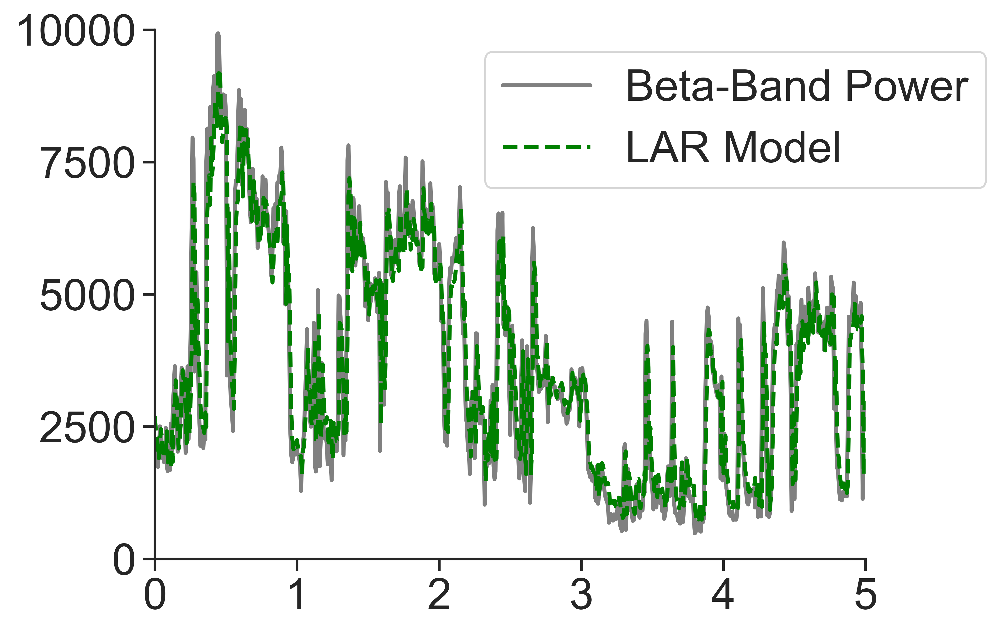

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/4034147861.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

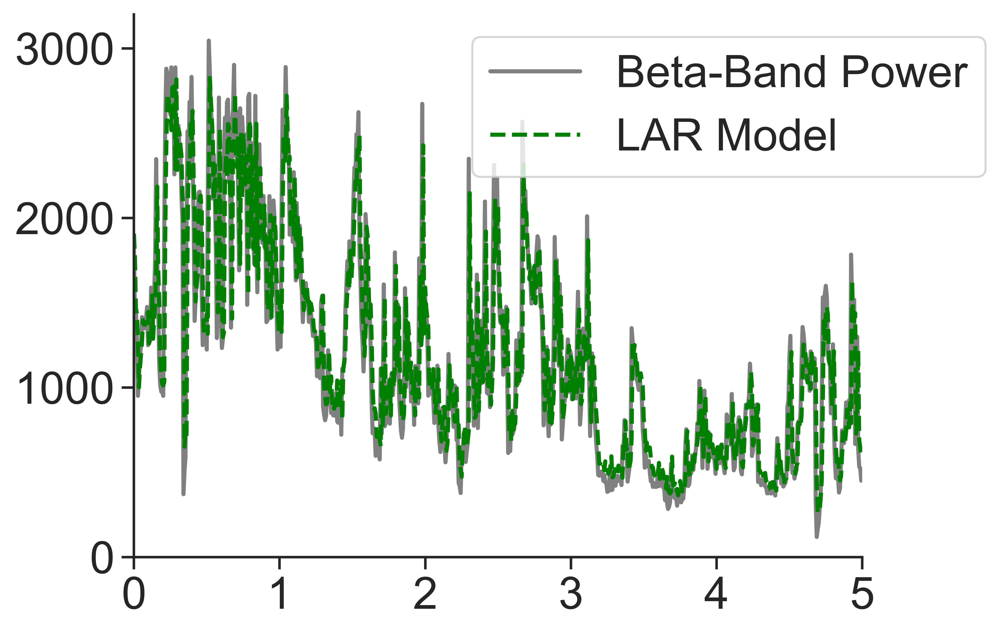

R² for 'status': 0.8093
R² for 'non_status': 0.8648


In [45]:
#LINEAR AR MODELS

#TRAINING ON **WHOLE*** DATA, THEN COMPARING R-SQUARED CALCULATED SEPARATELY ON STATUS/NON-STATUS INTERVALS DURING TESTING

import pandas as pd
import numpy as np
from sklearn.model_selection import KFold
import statsmodels.api as sm
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Set the maximum lag
max_lag = 144

# Function to create lagged features and align them with `y`
def create_lagged_features_with_y(data, max_lag):
    df = pd.DataFrame(data)
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[0].shift(lag)
    df = df.dropna().reset_index(drop=True)  # Drop rows with NaN values and reset index
    y = df[0]  # Target variable (aligned `y`)
    X = df.drop(columns=[0])  # Lagged features
    return X, y

# Function to perform 5-fold cross-validation and select significant lags
def select_significant_lags(X, y, max_lag):
    num_samples = len(X)
    if num_samples < 2:
        raise ValueError("Not enough samples for cross-validation.")
    n_splits = min(5, num_samples)
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    significant_lags = np.zeros(max_lag)

    for train_idx, test_idx in kf.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        model = sm.OLS(y_train, sm.add_constant(X_train)).fit(cov_type='HC0')
        significant = model.pvalues[1:] < 0.05  # Skip the constant term
        significant_lags += significant.astype(int)

    threshold = max(3, n_splits - 1)
    return [i + 1 for i, count in enumerate(significant_lags) if count >= threshold]

# Function to fit model on selected lags and predict
def fit_ar_model_with_lags(X, y, selected_lags):
    selected_lag_columns = ['lag_' + str(lag) for lag in selected_lags]
    model = sm.OLS(y, sm.add_constant(X[selected_lag_columns])).fit(cov_type='HC0')
    y_pred = model.predict(sm.add_constant(X[selected_lag_columns]))
    return y_pred, model

# Train the model on the full dataset
lfp_values_full = df_filtered['LFP power'].reset_index(drop=True)
X_full, y_full = create_lagged_features_with_y(lfp_values_full.values, max_lag)

# Perform iterative lag selection on the full dataset
selected_lags = select_significant_lags(X_full, y_full, max_lag)
print(f"Selected Lags (Full Dataset): {selected_lags}")

# Evaluate the model on each interval type
results = {}
for interval in ['status', 'non_status']:
    lfp_values = df_filtered[df_filtered['intervalType'] == interval]['LFP power'].reset_index(drop=True)
    if len(lfp_values) <= max_lag:
        print(f"Not enough data for interval '{interval}' after lagging.")
        continue

    # Create lagged features and aligned y
    X_interval, y_interval = create_lagged_features_with_y(lfp_values.values, max_lag)

    # Fit the model using selected lags
    y_pred_interval, model_interval = fit_ar_model_with_lags(X_interval, y_interval, selected_lags)

    # Calculate R²
    r2 = r2_score(y_interval, y_pred_interval)
    results[interval] = {
        'R2': r2,
        'Model': model_interval
    }

    # Plot model fit for the first 2 weeks of data
    days_to_plot = 5  # First 5 days
    X_plot, y_plot = X_interval[:days_to_plot * 144], y_interval[:days_to_plot * 144]
    y_pred_plot = y_pred_interval[:days_to_plot * 144]

    # Assuming y_plot.index is in intervals of 10 minutes, convert to days
    time_in_days = y_plot.index / (144)  # 144 intervals per day

    # Plot with Seaborn
    sns.set_style("ticks")
    #sns.set_context("talk")
    sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 2.0})
    #plt.figure(figsize=(14, 6))
    ax1 = sns.lineplot(x=time_in_days, y=y_plot, label="Beta-Band Power", color='grey')
    ax2 = sns.lineplot(x=time_in_days, y=y_pred_plot, label="LAR Model", color='green', linestyle='--')
    ax1.set(xlabel=None)
    ax1.set(ylabel=None)
    ax2.set(xlabel=None)
    ax2.set(ylabel=None)
    #ax1.get_legend().remove()
    #ax2.get_legend().remove()
    plt.xlim([0, days_to_plot])
    plt.xticks(np.arange(0, days_to_plot + 1, step=1))
    if interval == 'status':
        plt.ylim([0, 10000])
        plt.yticks(np.arange(0, 10001, step=2500))
    else:
        plt.ylim([0, 3200])
        plt.yticks(np.arange(0, 3001, step=1000))
    # Customize labels and title
    #plt.xlabel("Time (Days)")
    #plt.ylabel("LFP Power")
    #plt.title(f"Model Fit for First {days_to_plot} Days of '{interval}' Interval")
    #put legend outside of plot, add shadow as well
    #put legend above plot
    #sns.move_legend(ax1, "upper left", bbox_to_anchor=(1, 1))
    plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0),shadow=False, ncol=1)
    #plt.legend()
    sns.despine()
    plt.show()
    '''
    plt.figure(figsize=(14, 6))
    plt.plot(y_plot.index, y_plot, label="Actual LFP Power", color='blue')
    plt.plot(y_plot.index, y_pred_plot, label="Predicted LFP Power (LAR Model)", color='red', linestyle='--')
    plt.xlabel("Time (10-minute intervals)")
    plt.ylabel("LFP Power")
    plt.title(f"Model Fit for First 2 Weeks of '{interval}' Interval")
    plt.legend()
    plt.show()
    '''

# Print R² results for each interval
for interval, result in results.items():
    print(f"R² for '{interval}': {result['R2']:.4f}")



/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/1416751421.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/1416751421.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'lag_{lag}'] = df[0].shift(lag)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/1416751421.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

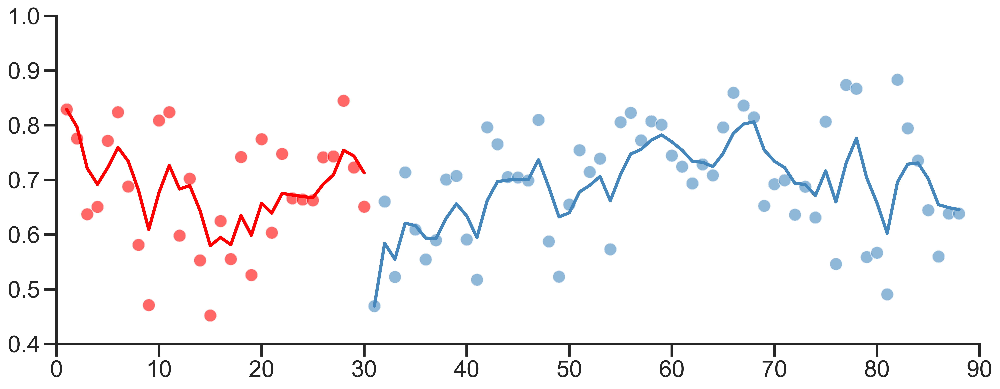

Data is normal. Performing Welch's t-test.
Status Mean R²: 0.6810
Non-Status Mean R²: 0.6926
Welch's t-test Results:
  Test statistic: -0.4809
  p-value: 0.6324


In [37]:
# Function to compute R-squared for status and non-status separately
def compute_daily_r2_by_interval(df_filtered, max_lag, significant_lags):
    daily_r2_records = []

    for interval in ['status', 'non_status']:
        # Filter data for the interval
        lfp_values = df_filtered[df_filtered['intervalType'] == interval]['LFP power'].reset_index(drop=True)
        if len(lfp_values) <= max_lag:
            print(f"Not enough data for interval '{interval}' after lagging.")
            continue

        # Create lagged features
        X_interval, y_interval = create_lagged_features_with_y(lfp_values.values, max_lag)

        # Fit a separate model for this interval
        selected_lag_columns = ['lag_' + str(lag) for lag in significant_lags]
        model = sm.OLS(y_interval, sm.add_constant(X_interval[selected_lag_columns])).fit(cov_type='HC0')
        y_pred_interval = model.predict(sm.add_constant(X_interval[selected_lag_columns]))

        # Compute daily R²
        days = len(y_interval) // 144  # Number of days based on 10-minute intervals
        for day in range(days):
            start_idx = day * 144
            end_idx = (day + 1) * 144

            # Get the data for the current day
            y_day = y_interval[start_idx:end_idx]
            y_pred_day = y_pred_interval[start_idx:end_idx]

            # Ensure alignment
            if len(y_day) != len(y_pred_day):
                print(f"Alignment issue on Day {day + 1}:")
                print(f"  y_day length: {len(y_day)}")
                print(f"  y_pred_day length: {len(y_pred_day)}")
                continue

            # Calculate R² for the day
            r2_day = r2_score(y_day, y_pred_day)

            # Append the record
            daily_r2_records.append({'Day': day + 1, 'R-squared': r2_day, 'IntervalType': interval})

    return daily_r2_records

significant_lags = [1, 3, 8, 9, 85, 111]  # From previous LAR training (on whole set) - significant lags
# Call the function and create the DataFrame
daily_r2_records = compute_daily_r2_by_interval(df_filtered, max_lag, significant_lags)
daily_r2_df = pd.DataFrame(daily_r2_records)

# Correctly shift non-status days
max_status_day = daily_r2_df[daily_r2_df['IntervalType'] == 'status']['Day'].max()
daily_r2_df['Adjusted Day'] = daily_r2_df.apply(
    lambda row: row['Day'] + max_status_day if row['IntervalType'] == 'non_status' else row['Day'], axis=1
)

'''
# Plot daily R² values with a 5-day EMA overlay
plt.figure(figsize=(14, 6))
for interval, color in zip(['status', 'non_status'], ['red', 'blue']):
    subset = daily_r2_df[daily_r2_df['IntervalType'] == interval]
    plt.scatter(subset['Adjusted Day'], subset['R-squared'], label=f'{interval.capitalize()} Daily R²', color=color, alpha=0.6)
    ema = subset['R-squared'].ewm(span=5).mean()
    plt.plot(subset['Adjusted Day'], ema, label=f'{interval.capitalize()} 5-Day EMA', color=color, linestyle='--')

plt.xlabel('Day')
plt.ylabel('R-squared')
plt.title('Daily R-squared Values with 5-Day EMA Overlay')
plt.legend()
plt.tight_layout()
plt.show()
'''
import seaborn as sns
import matplotlib.pyplot as plt

# Set Seaborn style
sns.set_style("ticks")
sns.set_context("poster")
#sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

# Create the Seaborn plot
plt.figure(figsize=(14, 6))

# Plot R-squared for status period
ax1 = sns.scatterplot(
    data=daily_r2_df[daily_r2_df['IntervalType'] == 'status'],
    x='Adjusted Day',
    y='R-squared',
    color='red',
    alpha=0.6,
    label=None
)
ax2 = sns.lineplot(
    data=daily_r2_df[daily_r2_df['IntervalType'] == 'status'],
    x='Adjusted Day',
    y=daily_r2_df[daily_r2_df['IntervalType'] == 'status']['R-squared'].ewm(span=5).mean(),
    color='red',
    linestyle='-',
    label=None
)

# Plot R-squared for non-status period
sns.scatterplot(
    data=daily_r2_df[daily_r2_df['IntervalType'] == 'non_status'],
    x='Adjusted Day',
    y='R-squared',
    color='#4587BD',
    alpha=0.6,
    label=None
)
sns.lineplot(
    data=daily_r2_df[daily_r2_df['IntervalType'] == 'non_status'],
    x='Adjusted Day',
    y=daily_r2_df[daily_r2_df['IntervalType'] == 'non_status']['R-squared'].ewm(span=5).mean(),
    color='#4587BD',
    linestyle='-',
    label=None
)

# Customize the plot
#plt.xlabel('Day', fontsize=12)
#plt.ylabel('R-squared', fontsize=12)
#plt.title('Daily R-squared Values with 5-Day EMA (Status vs. Non-Status)', fontsize=14)
plt.ylim(0.4, 1)  # Adjust y-axis limits if needed
plt.xlim(0, 90)  # Adjust y-axis limits if needed
#plt.legend()
plt.tight_layout()

ax1.set(xlabel=None)
ax1.set(ylabel=None)

sns.despine()
plt.show()


# Statistical comparison of daily R²
status_r2 = daily_r2_df[daily_r2_df['IntervalType'] == 'status']['R-squared']
non_status_r2 = daily_r2_df[daily_r2_df['IntervalType'] == 'non_status']['R-squared']

# Check normality
status_normality_p = shapiro(status_r2).pvalue
non_status_normality_p = shapiro(non_status_r2).pvalue

# Perform appropriate test
if status_normality_p >= 0.05 and non_status_normality_p >= 0.05:
    print("Data is normal. Performing Welch's t-test.")
    t_stat, p_value = ttest_ind(status_r2, non_status_r2, equal_var=False)
    test_name = "Welch's t-test"
else:
    print("Data is not normal. Performing Mann-Whitney U test.")
    t_stat, p_value = mannwhitneyu(status_r2, non_status_r2, alternative='two-sided')
    test_name = "Mann-Whitney U test"

# Print results
print(f"Status Mean R²: {status_r2.mean():.4f}")
print(f"Non-Status Mean R²: {non_status_r2.mean():.4f}")
print(f"{test_name} Results:")
print(f"  Test statistic: {t_stat:.4f}")
print(f"  p-value: {p_value:.4f}")



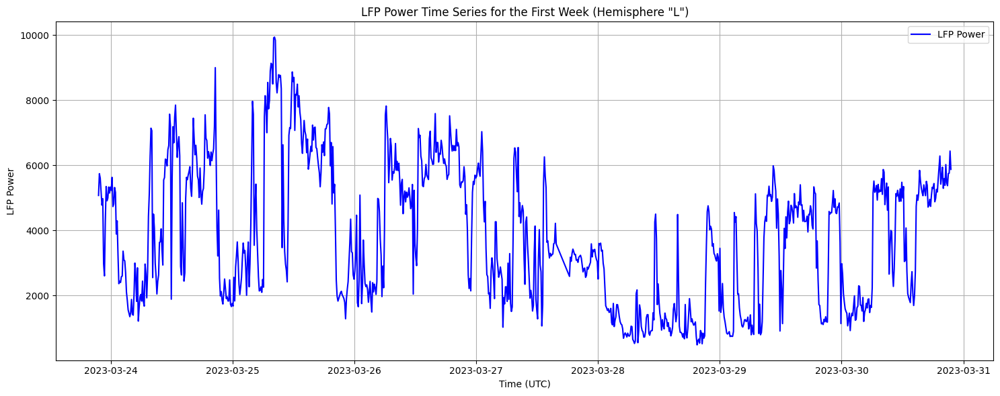

In [12]:
#Plot the data as time series

import matplotlib.pyplot as plt
import pandas as pd

narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)

df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']
df_filtered = df_filtered.sort_values(by='DateTime (UTC)').reset_index(drop=True)

start_time = df_filtered['DateTime (UTC)'].iloc[0]
end_time = start_time + pd.Timedelta(days=7)

# Filter the data to include only the first week
df_first_week = df_filtered[(df_filtered['DateTime (UTC)'] >= start_time) & 
                            (df_filtered['DateTime (UTC)'] < end_time)]

plt.figure(figsize=(15, 6))
plt.plot(df_first_week['DateTime (UTC)'], df_first_week['LFP power'], color='blue', label='LFP Power')
plt.xlabel('Time (UTC)')
plt.ylabel('LFP Power')
plt.title('LFP Power Time Series for the First Week (Hemisphere "L")')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


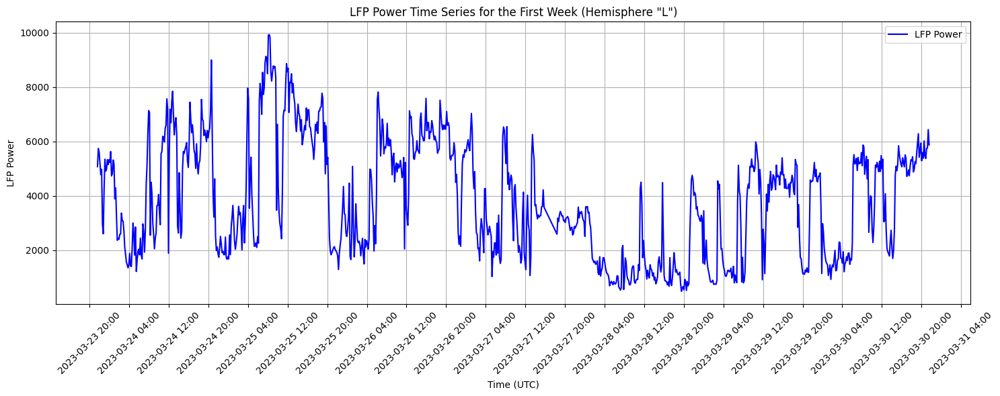

In [13]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Convert 'DateTime (UTC)' to datetime if not already done
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)

df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']
df_filtered = df_filtered.sort_values(by='DateTime (UTC)').reset_index(drop=True)
start_time = df_filtered['DateTime (UTC)'].iloc[0]
end_time = start_time + pd.Timedelta(days=7)
df_first_week = df_filtered[(df_filtered['DateTime (UTC)'] >= start_time) & 
                            (df_filtered['DateTime (UTC)'] < end_time)]

# Plot the time series of LFP power for the first week
plt.figure(figsize=(15, 6))
plt.plot(df_first_week['DateTime (UTC)'], df_first_week['LFP power'], color='blue', label='LFP Power')

# Set x-axis ticks to every 8 hours
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.HourLocator(interval=8))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(rotation=45)
plt.xlabel('Time (UTC)')
plt.ylabel('LFP Power')
plt.title('LFP Power Time Series for the First Week (Hemisphere "L")')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

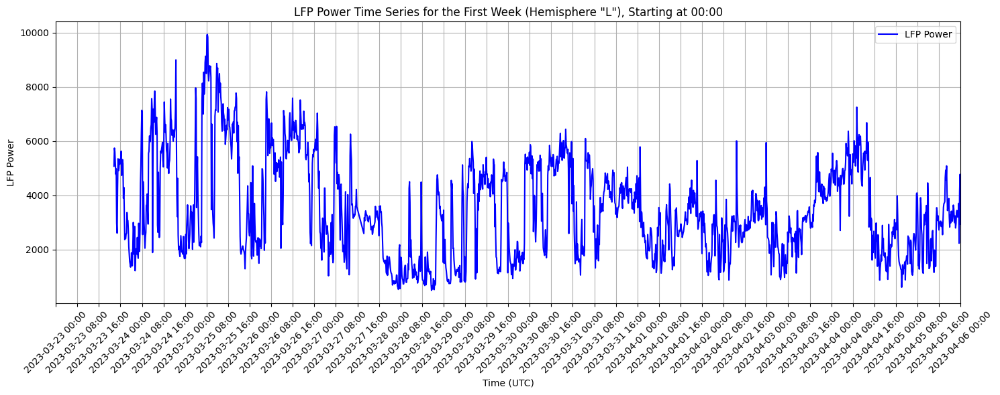

In [19]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Convert 'DateTime (UTC)' to datetime if not already done
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Sort the data by 'DateTime (UTC)' and reset index
df_filtered = df_filtered.sort_values(by='DateTime (UTC)').reset_index(drop=True)

# Calculate the start and end time of the first week, starting at midnight
start_time = df_filtered['DateTime (UTC)'].iloc[0].replace(hour=0, minute=0, second=0, microsecond=0)
end_time = start_time + pd.Timedelta(days=14)

# Filter the data to include only the first week
df_first_week = df_filtered[(df_filtered['DateTime (UTC)'] >= start_time) & 
                            (df_filtered['DateTime (UTC)'] < end_time)]

# Plot the time series of LFP power for the first week
plt.figure(figsize=(15, 6))
plt.plot(df_first_week['DateTime (UTC)'], df_first_week['LFP power'], color='blue', label='LFP Power')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.HourLocator(interval=8))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.set_xlim([start_time, end_time])
plt.xticks(rotation=45)
plt.xlabel('Time (UTC)')
plt.ylabel('LFP Power')
plt.title('LFP Power Time Series for the First Week (Hemisphere "L"), Starting at 00:00')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

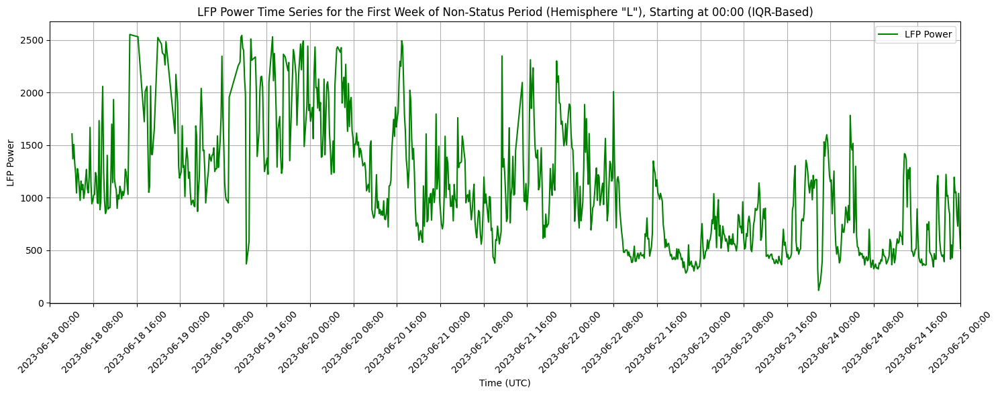

In [17]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Convert 'DateTime (UTC)' to datetime if not already done
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)

# Filter data for Hemisphere 'L' and non-status period
df_filtered = narrowband_df[(narrowband_df['Hemisphere'] == 'L') & 
                            (narrowband_df['intervalType'] == 'non_status')]

# Calculate Q1, Q3, and IQR for LFP power
Q1 = df_filtered['LFP power'].quantile(0.25)
Q3 = df_filtered['LFP power'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers outside the IQR bounds
df_filtered = df_filtered[(df_filtered['LFP power'] >= lower_bound) & 
                          (df_filtered['LFP power'] <= upper_bound)]

# Sort the data by 'DateTime (UTC)' and reset index
df_filtered = df_filtered.sort_values(by='DateTime (UTC)').reset_index(drop=True)

# Calculate the start and end time of the first week of the non-status period, starting at midnight
start_time = df_filtered['DateTime (UTC)'].iloc[0].replace(hour=0, minute=0, second=0, microsecond=0)
end_time = start_time + pd.Timedelta(days=7)

# Filter the data to include only the first week of the non-status period
df_first_week_non_status = df_filtered[(df_filtered['DateTime (UTC)'] >= start_time) & 
                                       (df_filtered['DateTime (UTC)'] < end_time)]

# Plot the time series of LFP power for the first week of the non-status period
plt.figure(figsize=(15, 6))
plt.plot(df_first_week_non_status['DateTime (UTC)'], df_first_week_non_status['LFP power'], color='green', label='LFP Power')

# Set x-axis ticks to every 8 hours
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.HourLocator(interval=8))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))

# Set x-axis limits to ensure the plot starts at 00:00
ax.set_xlim([start_time, end_time])

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Add labels and title
plt.xlabel('Time (UTC)')
plt.ylabel('LFP Power')
plt.title('LFP Power Time Series for the First Week of Non-Status Period (Hemisphere "L"), Starting at 00:00 (IQR-Based)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_52692/3934549111.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power', multiplier=3.0)).reset_index(drop=True)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_52692/3934549111.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df

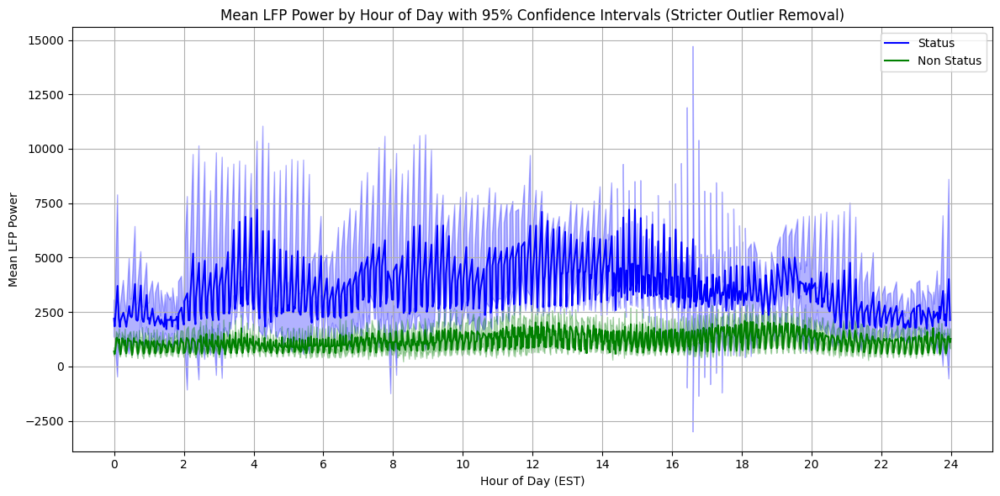

In [22]:
#Get data ready for larger time series plot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# Convert 'DateTime (UTC)' to datetime and extract EST if not done already
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')

# Extract the hour of day as a new column for grouping
narrowband_df['Hour (EST)'] = narrowband_df['DateTime (EST)'].dt.hour + narrowband_df['DateTime (EST)'].dt.minute / 60

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Define a function to remove outliers using a stricter IQR method
def remove_outliers_iqr(df, column, multiplier=3.0):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR  # Stricter lower bound for outliers
    upper_bound = Q3 + multiplier * IQR  # Stricter upper bound for outliers
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply stricter IQR-based outlier removal separately to each intervalType group
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power', multiplier=3.0)).reset_index(drop=True)

# Group by 'Hour (EST)' and 'intervalType', then calculate the mean and 95% confidence intervals
def calculate_ci(df):
    mean = df['LFP power'].mean()
    se = df['LFP power'].sem()
    ci = stats.t.ppf(0.975, df['LFP power'].count() - 1) * se  # 95% CI
    return pd.Series({'LFP_mean': mean, 'CI_lower': mean - ci, 'CI_upper': mean + ci})

# Group by 'Hour (EST)' and 'intervalType' after outlier removal
df_grouped = df_filtered.groupby(['Hour (EST)', 'intervalType']).apply(calculate_ci).reset_index()

# Separate data for each intervalType for plotting
status_data = df_grouped[df_grouped['intervalType'] == 'status']
non_status_data = df_grouped[df_grouped['intervalType'] == 'non_status']
other_data = df_grouped[df_grouped['intervalType'] == 'other']


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/849705313.py:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power', multiplier=3.0)).reset_index(drop=True)
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_3360/849705313.py:37: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_gro

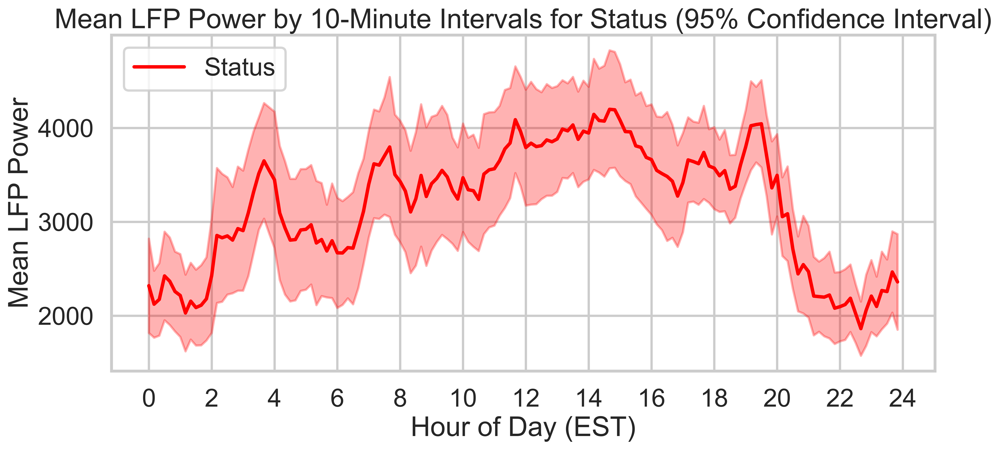

"\nplt.xlabel('Hour of Day (EST)')\nplt.ylabel('Mean LFP Power')\nplt.title('Mean LFP Power by 10-Minute Intervals for Non-Status (95% Confidence Interval)')\nplt.xticks(np.arange(0, 25, 2))  # Show every 2 hours on the x-axis\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n"

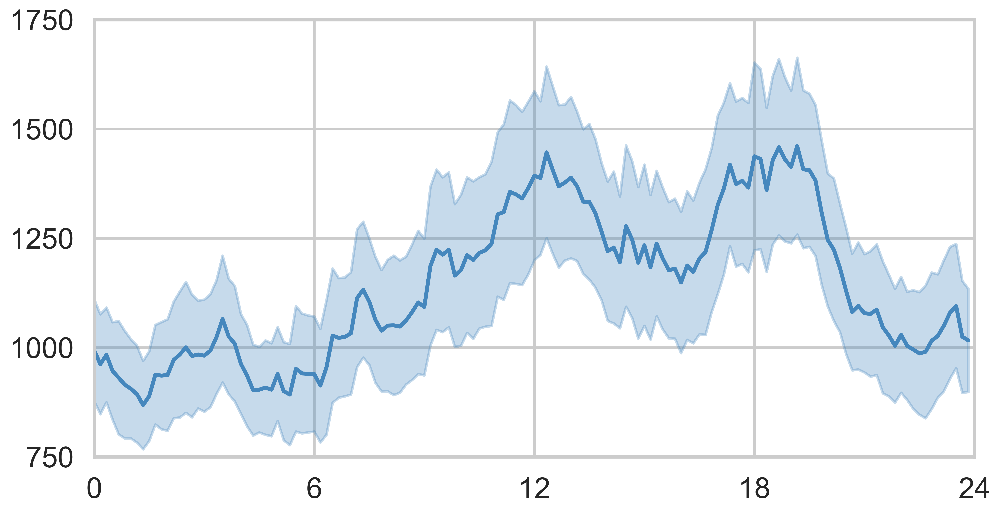

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# Convert 'DateTime (UTC)' to datetime and extract EST if not done already
narrowband_df['DateTime (UTC)'] = pd.to_datetime(narrowband_df['DateTime (UTC)'], utc=True)
narrowband_df['DateTime (EST)'] = narrowband_df['DateTime (UTC)'].dt.tz_convert('America/New_York')

# Extract the hour and minute (in 10-minute intervals) as a new column for grouping
narrowband_df['Time Bin (EST)'] = narrowband_df['DateTime (EST)'].dt.hour * 60 + narrowband_df['DateTime (EST)'].dt.minute
narrowband_df['Time Bin (EST)'] = narrowband_df['Time Bin (EST)'] // 10  # Each bin represents a 10-minute interval within the day

# Filter data for Hemisphere 'L'
df_filtered = narrowband_df[narrowband_df['Hemisphere'] == 'L']

# Define a function to remove outliers using a stricter IQR method
def remove_outliers_iqr(df, column, multiplier=3.0):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR  # Stricter lower bound for outliers
    upper_bound = Q3 + multiplier * IQR  # Stricter upper bound for outliers
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply stricter IQR-based outlier removal separately to each intervalType group
df_filtered = df_filtered.groupby('intervalType').apply(lambda group: remove_outliers_iqr(group, 'LFP power', multiplier=3.0)).reset_index(drop=True)

# Group by 'Time Bin (EST)' and 'intervalType', then calculate the mean and 95% confidence intervals
def calculate_ci(df):
    mean = df['LFP power'].mean()
    se = df['LFP power'].sem()
    ci = stats.t.ppf(0.975, df['LFP power'].count() - 1) * se  # 95% CI
    return pd.Series({'LFP_mean': mean, 'CI_lower': mean - ci, 'CI_upper': mean + ci})

# Group by 'Time Bin (EST)' and 'intervalType' after outlier removal, excluding 'other'
df_grouped = df_filtered[df_filtered['intervalType'].isin(['status', 'non_status'])].groupby(['Time Bin (EST)', 'intervalType']).apply(calculate_ci).reset_index()

# Separate data for each intervalType for plotting
status_data = df_grouped[df_grouped['intervalType'] == 'status']
non_status_data = df_grouped[df_grouped['intervalType'] == 'non_status']

# Convert 'Time Bin (EST)' back to hours for plotting (each bin represents 10 minutes)
status_data['Hour (EST)'] = status_data['Time Bin (EST)'] * 10 / 60
non_status_data['Hour (EST)'] = non_status_data['Time Bin (EST)'] * 10 / 60

# Plotting Status Data
#ax = sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 2.0})
ax = sns.set_context("poster")

plt.figure(figsize=(12, 6))
plt.plot(status_data['Hour (EST)'], status_data['LFP_mean'], label='Status', color='red')
plt.fill_between(status_data['Hour (EST)'], status_data['CI_lower'], status_data['CI_upper'], color='red', alpha=0.3)
plt.xlabel('Hour of Day (EST)')
plt.ylabel('Mean LFP Power')
plt.title('Mean LFP Power by 10-Minute Intervals for Status (95% Confidence Interval)')
plt.xticks(np.arange(0, 25, 2))  # Show every 2 hours on the x-axis
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting Non-Status Data
plt.figure(figsize=(12, 6))
plt.plot(non_status_data['Hour (EST)'], non_status_data['LFP_mean'], label='Non-Status', color='#4587BD')
plt.fill_between(non_status_data['Hour (EST)'], non_status_data['CI_lower'], non_status_data['CI_upper'], color='#4587BD', alpha=0.3)

# Customize the plot
#plt.xlabel('Time (24-Hour)')
plt.xlim(0, 24)
plt.ylim(750, 1750)
plt.yticks(np.arange(750, 1760, 250))
#plt.ylabel('Beta-Band Power [a.u.]')
plt.xticks(np.arange(0, 25, 6))  # Show every 2 hours on the x-axis
#plt.legend(title='Condition')
plt.grid(True)

'''
plt.xlabel('Hour of Day (EST)')
plt.ylabel('Mean LFP Power')
plt.title('Mean LFP Power by 10-Minute Intervals for Non-Status (95% Confidence Interval)')
plt.xticks(np.arange(0, 25, 2))  # Show every 2 hours on the x-axis
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_6628/3102793291.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  status_data['Condition'] = 'Status'
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_6628/3102793291.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_status_data['Condition'] = 'Non-Status'


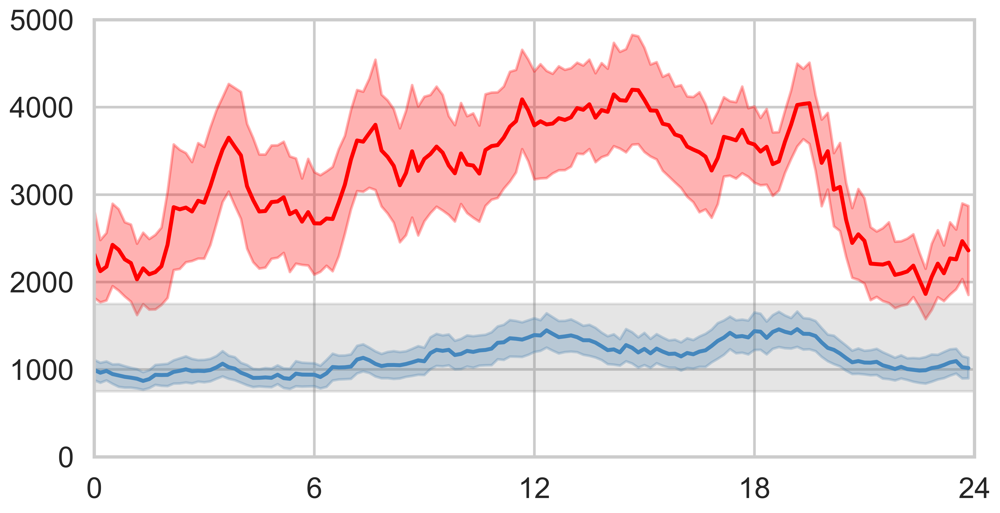

In [25]:
#More plots:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Combine the 'status_data' and 'non_status_data' into a single DataFrame for Seaborn
status_data['Condition'] = 'Status'
non_status_data['Condition'] = 'Non-Status'
combined_data = pd.concat([status_data, non_status_data])

# Convert 'Time Bin (EST)' back to hours for plotting
combined_data['Hour (EST)'] = combined_data['Time Bin (EST)'] * 10 / 60

# Set Seaborn style
sns.set_style("whitegrid")
#sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 2.0})
sns.set_context("poster")

# Create the combined line plot
plt.figure(figsize=(12, 6))
ax = sns.lineplot(
    data=combined_data,
    x='Hour (EST)',
    y='LFP_mean',
    hue='Condition',
    palette=['red', '#4587BD'],
    legend=False
)


# Add the confidence intervals using fill_between for both conditions
plt.fill_between(
    status_data['Hour (EST)'],
    status_data['CI_lower'],
    status_data['CI_upper'],
    color='red',
    alpha=0.3
)
plt.fill_between(
    non_status_data['Hour (EST)'],
    non_status_data['CI_lower'],
    non_status_data['CI_upper'],
    color='#4587BD',
    alpha=0.3
)

ax.set(xlabel = None)
ax.set(ylabel = None)

# Customize the plot
#plt.xlabel('Time (24-Hour)')
plt.xlim(0, 24)
plt.xticks(np.arange(0, 25, 6))  # Set x-ticks starting from 0 to 50 with steps of 5
plt.ylim(0, 5000)

plt.axhspan(750, 1750, xmin=0, xmax=1, color='grey', alpha=0.2)
#plt.ylabel('Beta-Band Power [a.u.]')
#plt.xticks(np.arange(0, 26, 2))  # Show every 2 hours on the x-axis
#plt.legend(title='Condition')
plt.grid(True)
#plt.tight_layout()

# Show the plot
plt.show()